In [ ]:
%matplotlib inline
from fastai.basics import *

In [ ]:
n=100

In [ ]:
x=torch.ones((n,2))
x[:,1].uniform_(-1,1)
x[:4]

tensor([[ 1.0000, -0.1117],
        [ 1.0000, -0.7875],
        [ 1.0000, -0.7374],
        [ 1.0000, -0.4248]])

In [ ]:
a=tensor(2.,-5.);a

tensor([ 2., -5.])

In [ ]:
x.shape,a.shape

(torch.Size([100, 2]), torch.Size([2]))

In [ ]:
y=x@a + torch.randn(n)

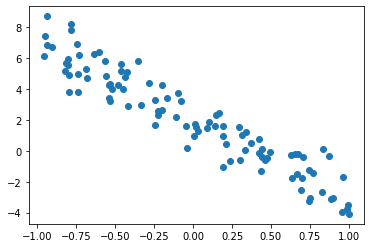

In [ ]:
plt.scatter(x[:,1],y)

In [ ]:
def mse(y_true,y_pred): return ((y_true-y_pred)**2).mean()

In [ ]:
a=tensor(-1.,1.)

In [ ]:
y_hat=x@a
loss=mse(y,y_hat)
loss

tensor(23.3120)

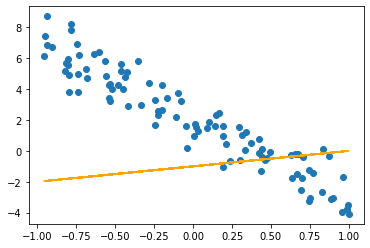

In [ ]:
plt.scatter(x[:,1],y)
plt.plot(x[:,1],y_hat,'-',color='orange')

#Gradient Descent

In [ ]:
a=nn.Parameter(a);a

Parameter containing:
tensor([-1.,  1.], requires_grad=True)

In [ ]:
def update():
  y_hat=x@a
  loss=mse(y,y_hat)
  if t%10==0: print(loss)
  loss.backward()
  with torch.no_grad():
    a.sub_(lr*a.grad)
    a.grad.zero_()
  return loss

In [ ]:
lr=1e-1
for t in range(100): update()

tensor(23.3120, grad_fn=<MeanBackward0>)
tensor(4.0977, grad_fn=<MeanBackward0>)
tensor(1.7386, grad_fn=<MeanBackward0>)
tensor(1.2006, grad_fn=<MeanBackward0>)
tensor(1.0723, grad_fn=<MeanBackward0>)
tensor(1.0417, grad_fn=<MeanBackward0>)
tensor(1.0343, grad_fn=<MeanBackward0>)
tensor(1.0326, grad_fn=<MeanBackward0>)
tensor(1.0322, grad_fn=<MeanBackward0>)
tensor(1.0321, grad_fn=<MeanBackward0>)


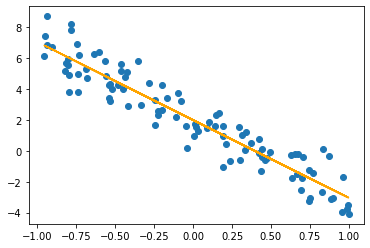

In [ ]:
y_hat=x@a.detach()
plt.scatter(x[:,1],y)
plt.plot(x[:,1],y_hat,"-",color='orange')

# Animate it!!!

In [ ]:
from matplotlib import animation,rc

In [ ]:
rc('animation',html='jshtml')

In [ ]:
a=nn.Parameter(tensor((-1.,1.)))

fig=plt.figure()
plt.scatter(x[:,1],y)
line, =plt.plot(x[:,1],x@a.detach(),'-',color='orange')
plt.close()

def animate(i):
  update()
  line.set_ydata(x@a.detach())
  return line
animation.FuncAnimation(fig,animate,np.arange(0,100),interval=20)

In [ ]:
# line.get_data()

In [ ]:
a=nn.Parameter(tensor((-1.,1.)))
lr=1e-1

fig=plt.figure(figsize=(20,8))
fig.add_subplot(1,2,1)
plt.title("Training Graph")
plt.scatter(x[:,1],y)
line, =plt.plot(x[:,1],x@a.detach(),'-',color='orange')
fig.add_subplot(1,2,2)
plt.title("Loss Graph")
loss_line, =plt.plot([],[],'-',color='blue')
plt.ylim(0,5)
plt.xlim(0,100)
plt.close()

def animate(i):
  loss=update().detach()
  line.set_ydata(x@a.detach())
  iter,loss_list=loss_line.get_data()
  iter=np.append(iter,[i])
  loss_list=np.append(loss_list,[loss])
  loss_line.set_data((iter,loss_list))
  return line,loss_line
animation.FuncAnimation(fig,animate,np.arange(0,100),interval=20)

In [ ]:
a

Parameter containing:
tensor([ 1.6697, -2.0743], requires_grad=True)

In [ ]:
def append_data(line,new_data):
  a,b=line.get_data()
  x,y=new_data
  line.set_data(np.append(a,[x]),np.append(b,[y]))

In [ ]:
a=nn.Parameter(tensor((-1.,1.)))
lr=1e-1

fig=plt.figure(figsize=(15,8))
fig.add_subplot(2,2,1)
plt.title("Training Graph")
plt.scatter(x[:,1],y)
line, =plt.plot(x[:,1],x@a.detach(),'-',color='orange')
fig.add_subplot(2,2,2)
plt.title("Loss Graph")
loss_line, =plt.plot([0],[0],'-',color='blue')
plt.ylim(0,5)
plt.xlim(0,100)
fig.add_subplot(2,2,3)
plt.title("Bias Graph")
bias_line, =plt.plot([],[],'-',color='blue')
plt.ylim(0,20)
plt.xlim(-5,5)
fig.add_subplot(2,2,4)
plt.title("Weight Graph")
weight_line, =plt.plot([],[],'-',color='blue')
plt.ylim(0,20)
plt.xlim(-10,0)
plt.close()

def animate(i):
  loss=update().detach()
  line.set_ydata(x@a.detach())
  append_data(loss_line,(i,loss))
  append_data(bias_line,(a.detach()[0],loss))
  append_data(weight_line,(a.detach()[1],loss))
  
  return line,loss_line,bias_line,weight_line
animation.FuncAnimation(fig,animate,np.arange(0,100),interval=20)